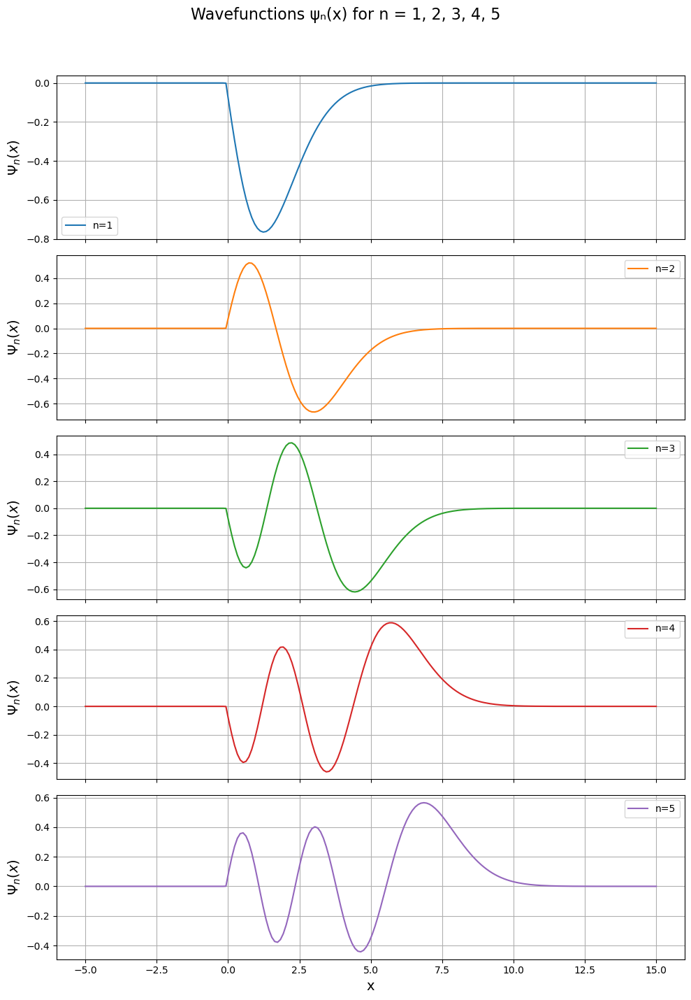

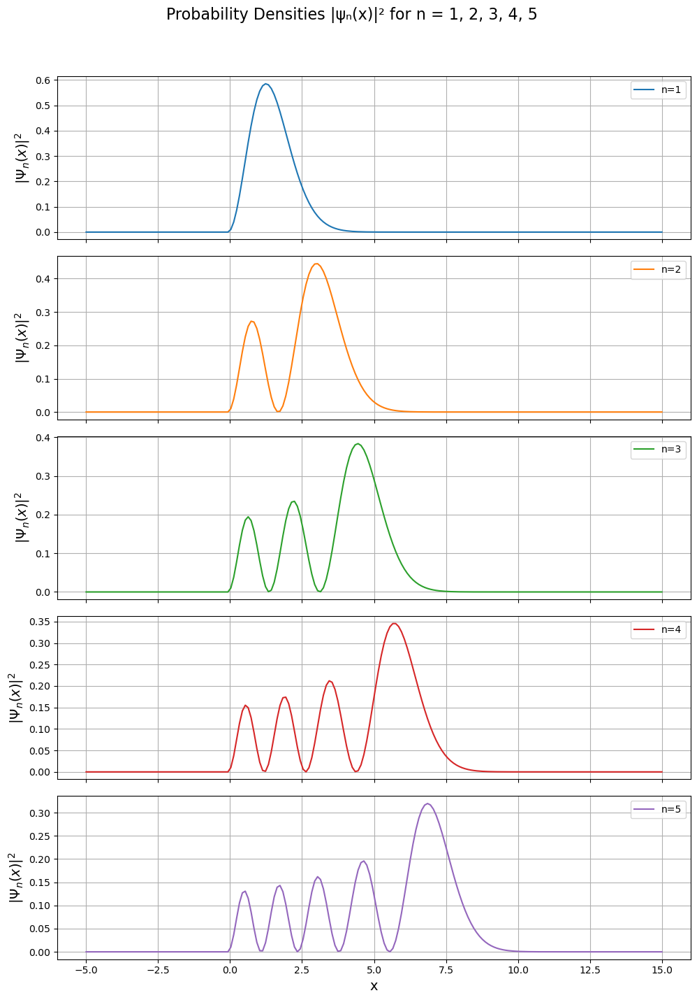

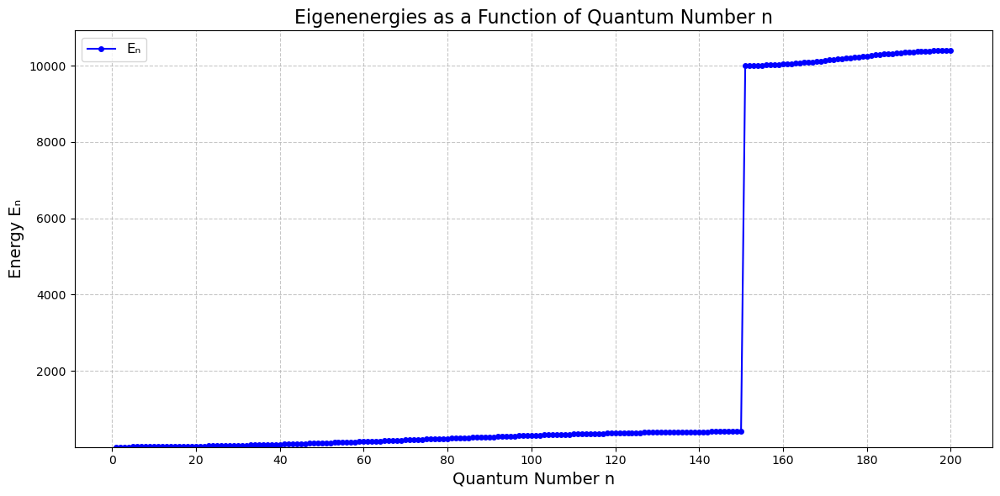

In [1]:
#Q1

import numpy as np
import matplotlib.pyplot as plt

# Parameters
N = 200                 # Number of grid points
dx = 0.1                # Spatial step size
x_start = -5            # Start of x range
x_end = 15              # End of x range
V_large = 1e4           # V(x) = 10^4 for x < 0

# Create spatial grid
x = np.linspace(x_start, x_end, N)

# Initialize potential
V = np.where(x >= 0, x, V_large)  # V(x) = x for x >= 0, else 10^4

# Construct the Hamiltonian matrix using the Numerov method
# Kinetic energy using finite difference (second derivative)
T = np.diag(2.0 / dx**2 * np.ones(N))
T += np.diag(-1.0 / dx**2 * np.ones(N-1), k=1)
T += np.diag(-1.0 / dx**2 * np.ones(N-1), k=-1)

# Potential energy matrix
V_matrix = np.diag(V)

# Hamiltonian
H = T + V_matrix

# Solve the eigenvalue problem
eigenvalues, eigenvectors = np.linalg.eigh(H)

# Select the first 200 eigenvalues and corresponding eigenvectors
num_states = 200
energies = eigenvalues[:num_states]
wavefunctions = eigenvectors[:, :num_states]

# Normalize the wavefunctions
for i in range(num_states):
    norm = np.sqrt(np.sum(np.abs(wavefunctions[:, i])**2) * dx)
    wavefunctions[:, i] /= norm


# --- Plotting Selected Wavefunctions and Probability Densities ---
# Plot wavefunctions and probability densities for n=1 to 5

selected_states = [1, 2, 3, 4, 5]
selected_indices = [n-1 for n in selected_states]  # Zero-based indexing

# Plot the first five wavefunctions in separate subplots
fig, axs = plt.subplots(len(selected_states), 1, figsize=(10, 15), sharex=True)

for i, ax in zip(selected_indices, axs):
    ax.plot(x, wavefunctions[:, i], label=f'n={i+1}', color=f'C{i}')
    ax.set_ylabel(r'$\Psi_n(x)$', fontsize=14)
    ax.legend()
    ax.grid(True)

axs[-1].set_xlabel('x', fontsize=14)
plt.suptitle('Wavefunctions ψₙ(x) for n = 1, 2, 3, 4, 5', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Plot the first five probability densities in separate subplots
fig, axs = plt.subplots(len(selected_states), 1, figsize=(10, 15), sharex=True)

for i, ax in zip(selected_indices, axs):
    ax.plot(x, wavefunctions[:, i]**2, label=f'n={i+1}', color=f'C{i}')
    ax.set_ylabel(r'$|\Psi_n(x)|^2$', fontsize=14)
    ax.legend()
    ax.grid(True)

axs[-1].set_xlabel('x', fontsize=14)
plt.suptitle('Probability Densities |ψₙ(x)|² for n = 1, 2, 3, 4, 5', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# --- Plotting Eigenenergies as a Function of n ---
# Create a list of quantum numbers n = 1, 2, ..., 200
n_list = np.arange(1, num_states + 1)

# Plot the eigenenergies
plt.figure(figsize=(12, 6))
plt.plot(n_list, energies, 'o-', color='blue', markersize=4, label='Eₙ')
plt.xlabel('Quantum Number n', fontsize=14)
plt.ylabel('Energy Eₙ', fontsize=14)
plt.title('Eigenenergies as a Function of Quantum Number n', fontsize=16)
plt.xticks(np.arange(0, 201, 20))  # Show every 20th quantum number on x-axis for clarity
plt.ylim(min(energies)*0.95, max(energies)*1.05)  # Expand y-axis limits
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

As the sum of probability is: 1.0 we can say it is normalized


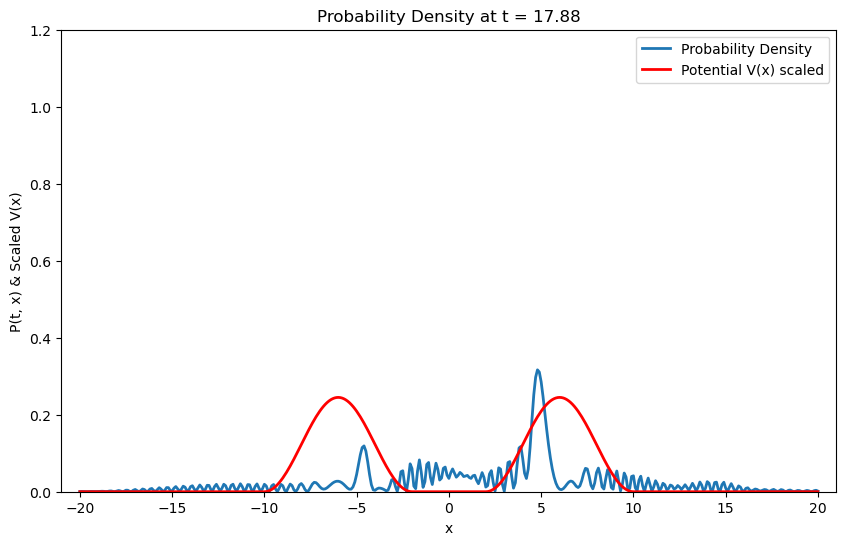

In [2]:
#2(a)

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc

# Set parameters
hbar = 1
m = 1
x0 = 0
L = 40
sigma0 = 1
k0 = 7
N = 401
tau = 0.03
tn = 600
h = 0.1
dx = 0.1

# Create spatial grid
x_list = [i * h - L / 2 for i in range(N)]  # x from -20 to +20

# Initialize psi_list with complex data type
psi_list = np.zeros((tn, N), dtype=np.complex64)

# Set psi_0
for i in range(N):
    psi_list[0, i] = (1 / np.sqrt(sigma0 * np.sqrt(2 * np.pi))) * \
                     np.exp(1j * k0 * (x_list[i] - x0)) * \
                     np.exp(-0.5 * (x_list[i] - x0)**2 / (2 * sigma0**2))

# Check normalization
total_prob = np.sum(np.abs(psi_list[0])**2) * h
print('As the sum of probability is:', total_prob, 'we can say it is normalized')

# Build the H matrix
matrix_H = np.zeros((N, N))

# First row
matrix_H[0, 0] = - (hbar**2) / (2 * m) * (-2 / h**2)
matrix_H[0, 1] = - (hbar**2) / (2 * m) * (1 / h**2)

# Last row
matrix_H[N-1, N-1] = - (hbar**2) / (2 * m) * (-2 / h**2)
matrix_H[N-1, N-2] = - (hbar**2) / (2 * m) * (1 / h**2)

# Other rows
for i in range(1, N-1):
    matrix_H[i, i] = - (hbar**2) / (2 * m) * (-2 / h**2)
    matrix_H[i, i+1] = - (hbar**2) / (2 * m) * (1 / h**2)
    matrix_H[i, i-1] = - (hbar**2) / (2 * m) * (1 / h**2)
    # Define potential V(x)
    if 100 < i < 180:  # x between -10 and -2
        matrix_H[i, i] += (k0**2 / 2) * (np.cos(np.pi * (x_list[i] + 6) / 8)**2)
    elif 220 < i < 300:  # x between 2 and 10
        matrix_H[i, i] += (k0**2 / 2) * (np.cos(np.pi * (x_list[i] - 6) / 8)**2)
    # Else, potential remains zero

# Extract Potential V(x) from Hamiltonian
kinetic_term = (hbar**2) / (m * h**2)  # 100 in this case
V = np.diag(matrix_H) - kinetic_term

# Scale Potential for plotting
scale_factor = 0.01  # Adjust this factor as needed
V_scaled = V * scale_factor

# Create matrices for Crank-Nicolson
identity = np.identity(N)
mat_1plus = identity + (1j * tau / (2 * hbar)) * matrix_H
mat_1minus = identity - (1j * tau / (2 * hbar)) * matrix_H

# Precompute the inverse of mat_1plus
try:
    mat_1plus_inv = np.linalg.inv(mat_1plus)
except np.linalg.LinAlgError:
    print("Matrix inversion failed. Check the Hamiltonian matrix for singularity.")
    mat_1plus_inv = np.linalg.pinv(mat_1plus)  # Use pseudo-inverse as fallback

total_prob = np.zeros(tn)

# Time evolution using Crank-Nicolson
for i in range(1, tn):
    psi_prev = psi_list[i-1].reshape(N, 1)  # Column vector
    psi_new = mat_1plus_inv @ (mat_1minus @ psi_prev)
    psi_new = psi_new.reshape(N,)
    # Normalize
    norm = np.sqrt(np.sum(np.abs(psi_new)**2) * h)
    psi_new /= norm
    psi_list[i] = psi_new
    #calcualte the total probability
    total_prob[i] = np.sum(np.abs(psi_new)**2) * h

# --- Animation with Potential ---
fig2, ax2 = plt.subplots(figsize=(10, 6))
line2, = ax2.plot([], [], lw=2, label='Probability Density')
line_pot, = ax2.plot(x_list, V_scaled, color='red', lw=2, label='Potential V(x) scaled')
plt.xlim(-21, 21)
plt.ylim(0, 1.2)  # Adjust based on P(t,x) and V_scaled
ax2.set_xlabel('x')
ax2.set_ylabel('P(t, x) & Scaled V(x)')
ax2.set_title('Probability Density and Potential Barrier Over Time')
ax2.legend()

# Initialize plot
def init():
    line2.set_data([], [])
    return line2, line_pot,

# Update function for animation
def animate2(i):
    frame = i * 4  # Adjust frame step as needed
    if frame >= tn:
        frame = tn - 1
    xx = x_list
    yy = np.abs(psi_list[frame])**2
    line2.set_data(xx, yy)
    ax2.set_title(f'Probability Density at t = {frame * tau:.2f}')
    return line2, line_pot

anim2 = animation.FuncAnimation(fig2, animate2, frames=150, init_func=init,
                                interval=150, blit=True)


# Configure animation display in Jupyter
rc('animation', html='jshtml')
anim2










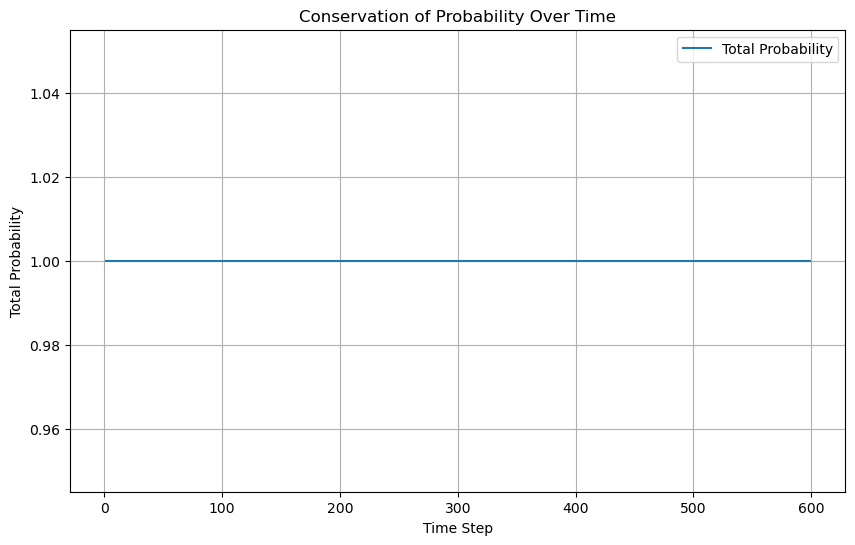

In [3]:
#2(b)

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(total_prob)), total_prob[1:], label='Total Probability')
plt.xlabel('Time Step')
plt.ylabel('Total Probability')
plt.title('Conservation of Probability Over Time')
plt.legend()
plt.grid(True)
plt.show()